## **Import packages for analysis**

In [1]:
import sys
sys.path.insert(0, '/home/tchari/monod/src/')

In [2]:
# import monod
# from monod import preprocess, extract_data, cme_toolbox, inference, analysis

import monod
from monod.preprocess import *
from monod.extract_data import extract_data
import monod.cme_toolbox as cme_toolbox
from monod.cme_toolbox import CMEModel
import monod.inference as inference
from monod.inference import InferenceParameters, GradientInference
import monod.analysis as analysis
from monod.analysis import *


In [3]:
import pandas as pd
import numpy as np
import loompy as lp
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
import scipy.stats
import anndata
import os
import scipy.io as sio




In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## **Read in data and metadata**

GEO links for study's original counts shown below for reference. Loom file of counts over all stages used in analysis made from concatenated loom files. See 'Making the input loom' section at the end of the notebook.

In [ ]:
#Unspliced and spliced counts from Mayere et al obtained from:
#! wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE136nnn/GSE136220/suppl/GSE136220%5Fraw%5Fcounts%5Fmatrix%5Fpgcs%5Fno%5Fadrenal.csv.gz
#! wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE136nnn/GSE136220/suppl/GSE136220%5Fraw%5Fcounts%5Fmatrix%5Fpgcs%5Fno%5Fadrenal%5Funspliced.csv.gz
    

In [5]:
meta_path = "/home/tchari/metadata/"
meta = pd.read_csv(meta_path+'germCell_meta.csv')
meta.head()

,identity,cell_barcode
0,170830_AGPM_E10,170830_AGPM_E10:AGGTCATGTTGTCGCGx
1,170830_AGPM_E10,170830_AGPM_E10:ATCTGCCGTGCGAAACx
2,170830_AGPM_E10,170830_AGPM_E10:CAAGGCCCAAAGGAAGx
3,170830_AGPM_E10,170830_AGPM_E10:CAAGTTGTCCCATTTAx
4,170830_AGPM_E10,170830_AGPM_E10:CGTGTCTTCCAGAGGAx


In [6]:
np.unique(meta['identity'])

array(['170313_O_E16', '170313_T_E16', '170712_O_E16', '170712_T_E16',
       '170724_O_E12', '170724_T_E12', '170726_T_E13', '170802_T_E13',
       '170814_AGPF_E11', '170814_AGPM_E11', '170816_O_E12',
       '170816_T_E12', '170823_AGPF_E11', '170823_AGPM_E11',
       '170828_AGPF_E10', '170828_AGPM_E10', '170830_AGPF_E10',
       '170830_AGPM_E10', '180222_O_E13', '180410_O_E13'], dtype=object)

Set up files/output files for *Monod* runs

In [7]:
dataset_meta = ['allconds']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [[i] for i in np.unique(meta['identity'])]

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['germ_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200524_mouse_genome_polyA_cum_1' 

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/germcell_splicing/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

dataset_meta:  ['allconds']

dataset_names:  ['germ_allconds_170313_O_E16', 'germ_allconds_170313_T_E16', 'germ_allconds_170712_O_E16', 'germ_allconds_170712_T_E16', 'germ_allconds_170724_O_E12', 'germ_allconds_170724_T_E12', 'germ_allconds_170726_T_E13', 'germ_allconds_170802_T_E13', 'germ_allconds_170814_AGPF_E11', 'germ_allconds_170814_AGPM_E11', 'germ_allconds_170816_O_E12', 'germ_allconds_170816_T_E12', 'germ_allconds_170823_AGPF_E11', 'germ_allconds_170823_AGPM_E11', 'germ_allconds_170828_AGPF_E10', 'germ_allconds_170828_AGPM_E10', 'germ_allconds_170830_AGPF_E10', 'germ_allconds_170830_AGPM_E10', 'germ_allconds_180222_O_E13', 'germ_allconds_180410_O_E13']
len(dataset_names):  20

loom_filepaths:  ['/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/all

## **Filter cell barcodes**

Filter for barcodes which have enought UMIs

Dataset allconds. 
	14750 barcodes in loom, 12897 pass filter. 14750 in annotations; of these, 14750 in loom and 12897 in filtered loom.
	['170313_O_E16']: 340 cells in annotations. 340 in loom. 286 pass filter.
	['170313_T_E16']: 197 cells in annotations. 197 in loom. 178 pass filter.
	['170712_O_E16']: 1825 cells in annotations. 1825 in loom. 823 pass filter.
	['170712_T_E16']: 407 cells in annotations. 407 in loom. 345 pass filter.
	['170724_O_E12']: 1571 cells in annotations. 1571 in loom. 1505 pass filter.
	['170724_T_E12']: 340 cells in annotations. 340 in loom. 332 pass filter.
	['170726_T_E13']: 2246 cells in annotations. 2246 in loom. 1905 pass filter.
	['170802_T_E13']: 1234 cells in annotations. 1234 in loom. 1223 pass filter.
	['170814_AGPF_E11']: 251 cells in annotations. 251 in loom. 249 pass filter.
	['170814_AGPM_E11']: 218 cells in annotations. 218 in loom. 204 pass filter.
	['170816_O_E12']: 1040 cells in annotations. 1040 in loom. 1014 pass filter.
	['170816_T_E12']:

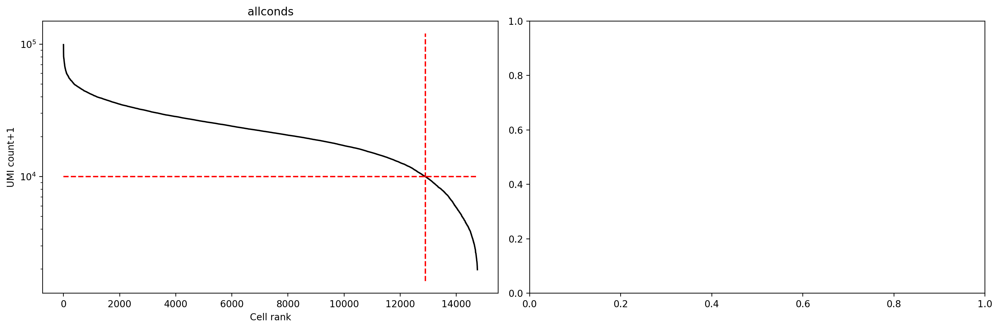

In [8]:
cf = []
thr_lb = [1e4]*len(dataset_meta)*2

fig1,ax1 = plt.subplots(1,len(dataset_meta)*2,figsize=(15,5))

for k in range(len(dataset_meta)):
    filename = loom_filepaths[len(subcluster_names)*k]
    dataset_name = raw_data_locations[len(subcluster_names)*k]
    
    with lp.connect(filename,mode='r') as ds:
        S = ds.layers[spliced_layer][:]
        U = ds.layers[unspliced_layer][:]
        gene_names = ds.ra[gene_attr]
        bcs = ds.ca[cell_attr]
        n_cells = S.shape[1]
        monod.preprocess.knee_plot(S+U,ax1[k],viz=True,thr=thr_lb[k])
        cf_ = ((S+U).sum(0)>thr_lb[k])
        
        n_annot_bcs = len(meta['cell_barcode'])
        annot_bcs_in_loom = meta['cell_barcode'].isin(bcs).sum()
        annot_bcs_in_filt_loom = meta['cell_barcode'].isin(bcs[cf_]).sum()
        print(f'Dataset {dataset_name}. \n\t{len(bcs)} barcodes in loom, {cf_.sum()} pass filter. {n_annot_bcs} in annotations; of these, {annot_bcs_in_loom} in loom and {annot_bcs_in_filt_loom} in filtered loom.')
        
        #if k==0:
        for subcluster in subcluster_names:
            annot_bcs = meta[(meta['identity'].isin(subcluster))]['cell_barcode']
            cf.append(np.isin(bcs,annot_bcs) & cf_)
            print(f'\t{subcluster}: {len(annot_bcs)} cells in annotations. {np.isin(bcs,annot_bcs).sum()} in loom. {cf[-1].sum()} pass filter.')



    ax1[k].set_title(dataset_name)
    
!mkdir ./figs    
fig_dir = './figs/'
fig_string = fig_dir + 'kneeplots_all_germ.png'
fig1.tight_layout()
plt.savefig(fig_string,dpi=450)

In [9]:
print("Cells per subcluster: ", [x.sum() for x in cf])

Cells per subcluster:  [286, 178, 823, 345, 1505, 332, 1905, 1223, 249, 204, 1014, 1352, 91, 362, 4, 49, 7, 10, 1470, 1488]


In [10]:
#Conditions with too few cells after filtering
ok = []
okinds = []
for i in range(len(subcluster_names)):
    x = cf[i]
    if x.sum() > 50:
        ok += [subcluster_names[i]]
        okinds += [i]
print(len(ok))

16


In [11]:
dataset_meta = ['allconds']
print('dataset_meta: ', dataset_meta)
print()

subcluster_names = [i for i in ok]

sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['germ_'+dataset_meta[0]+'_'+y  for y in sub_names_only]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

raw_data_locations = [dataset_meta[0] for y in sub_names_only]
transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200524_mouse_genome_polyA_cum_1'

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/germcell_splicing/loom/'+x+'.loom' for x in raw_data_locations] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

cf = np.array(cf)[okinds]

dataset_meta:  ['allconds']

dataset_names:  ['germ_allconds_170313_O_E16', 'germ_allconds_170313_T_E16', 'germ_allconds_170712_O_E16', 'germ_allconds_170712_T_E16', 'germ_allconds_170724_O_E12', 'germ_allconds_170724_T_E12', 'germ_allconds_170726_T_E13', 'germ_allconds_170802_T_E13', 'germ_allconds_170814_AGPF_E11', 'germ_allconds_170814_AGPM_E11', 'germ_allconds_170816_O_E12', 'germ_allconds_170816_T_E12', 'germ_allconds_170823_AGPF_E11', 'germ_allconds_170823_AGPM_E11', 'germ_allconds_180222_O_E13', 'germ_allconds_180410_O_E13']
len(dataset_names):  16

loom_filepaths:  ['/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom', '/home/tchari/counts/germcell_splicing/loom/allconds.loom',

In [12]:
#Final list of selected barcodes in each condition (stage)
cf = list(cf)

## **Gene Filtering**

Filter for moderately expressed genes across cells

In [13]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

In [212]:
!mkdir ./fits

mkdir: cannot create directory ‘./fits’: File exists


In [14]:
#From Mayere et al study https://faseb.onlinelibrary.wiley.com/doi/full/10.1096/fj.202002420R
markers = ['Bnc2', 'Dmrt1', 'Tet1', 'Ccnd3','Tbrg4', 'Rbm38', 
           'Supt6','Nanos2', 'Dnmt3l' ,'Piwil4', 'Pou5f1',
           'Stra8', 'Rec8','Nanog','Lefty1', 'Lefty2','Pycr2',
          'Id1','Bmp2','Fst','Inhbb','Grem2',
          'Cdx2','Gata2','Msx1','Msx2','Zfp42','Lhx1',
          'Stra8', 'Sycp1', 'Sycp3', 'Sync3', 'Spo11', 'Ccdc155', 'Dmc1', 'Mei1',
           'Mei4', 'Meioc', 'Hormad1', 'Hormad2', 'Msh5', 'Tex11', 'Prdm9', 'Zglp1', 'Smc1b',
          'Pitx2','Otx2','Gata2', 'Id1', 'Id2', 'Id3', 'Cdx2', 'Smad6', 'Dlx3', 'Msx1', 'Msx2']



markers = np.unique(markers)
print(len(markers))

ds = lp.connect('/home/tchari/counts/germcell_splicing/loom/allconds.loom')
all_names = ds.ra['gene_name']
ds.close()

markers = [i for i in markers if i in all_names]
print(len(markers))

50
40


INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1 created.
INFO:root:Dataset: germ_allconds_170313_O_E16
INFO:root:286 cells detected.
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:1645 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16 created.
INFO:root:Dataset: germ_allconds_170313_T_E16
INFO:root:178 cells detected.
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:1403 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16 created.
INFO:root:Dataset: germ_allconds_170712_O_E16
INFO:root:823 cells detected.
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:1461 genes retained after expression filter.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_a

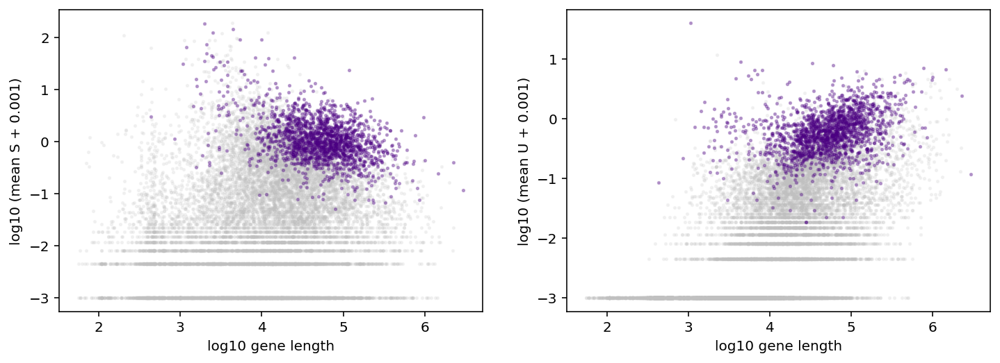

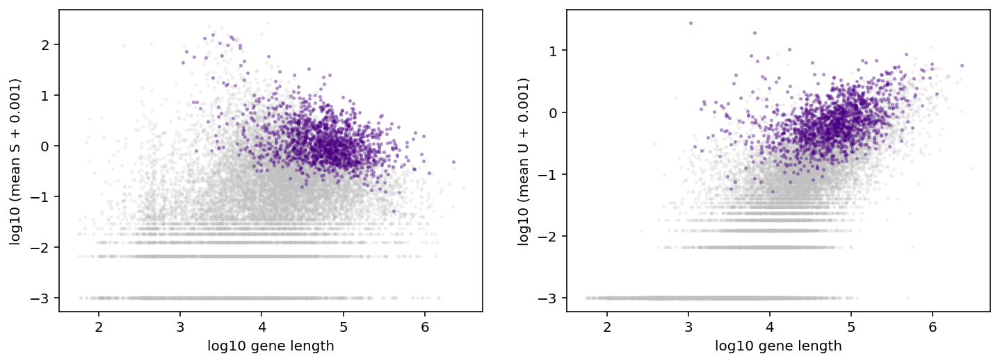

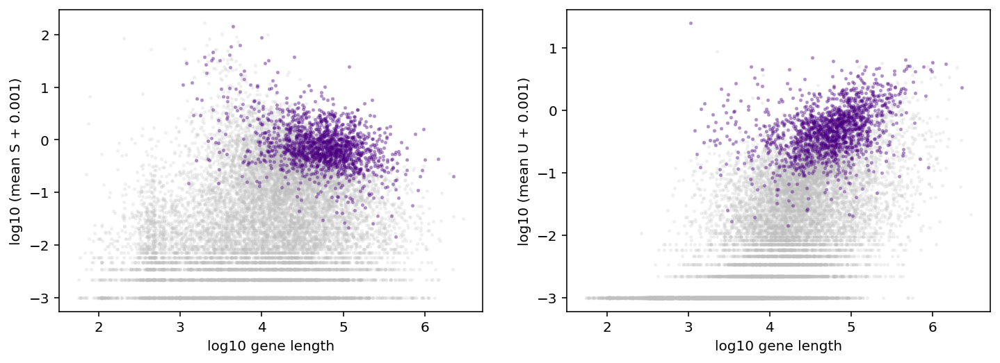

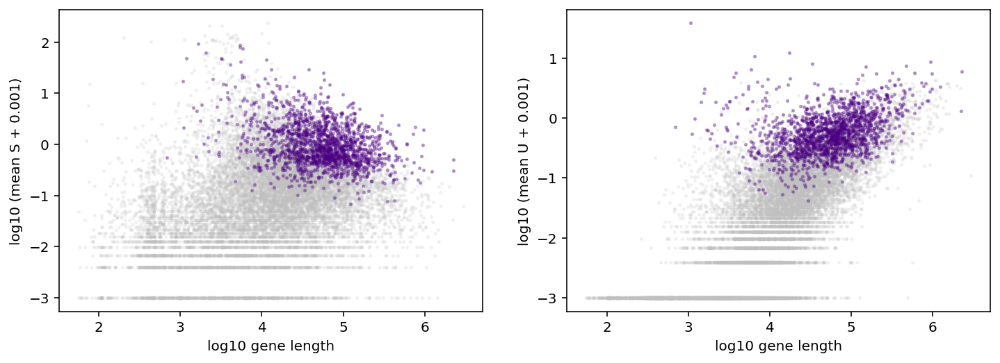

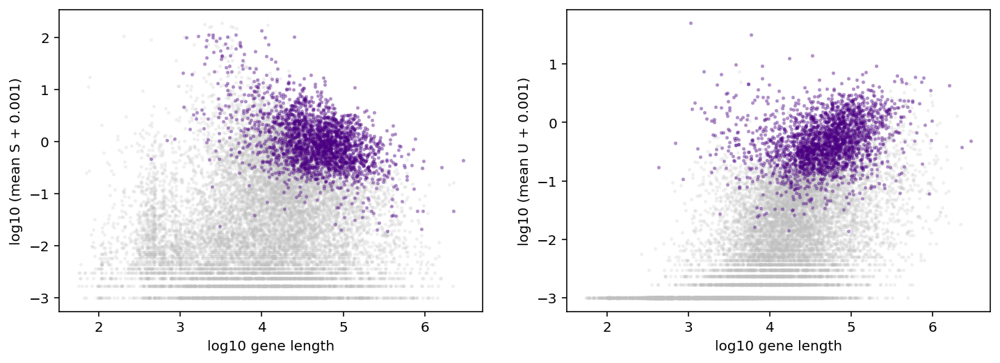

...

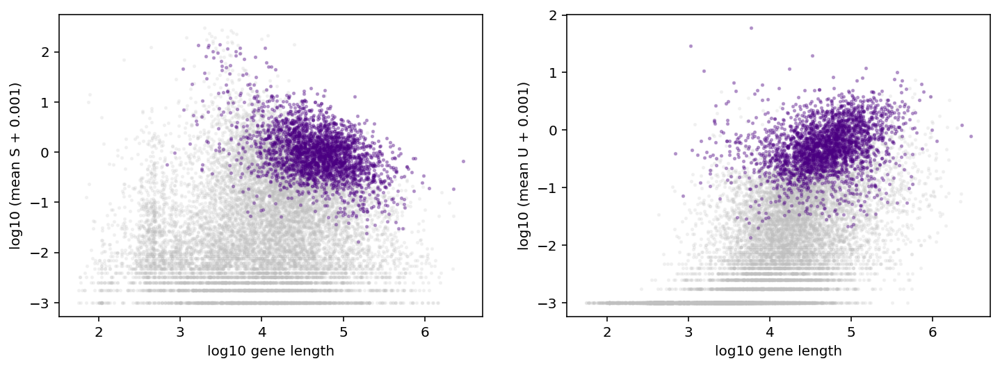

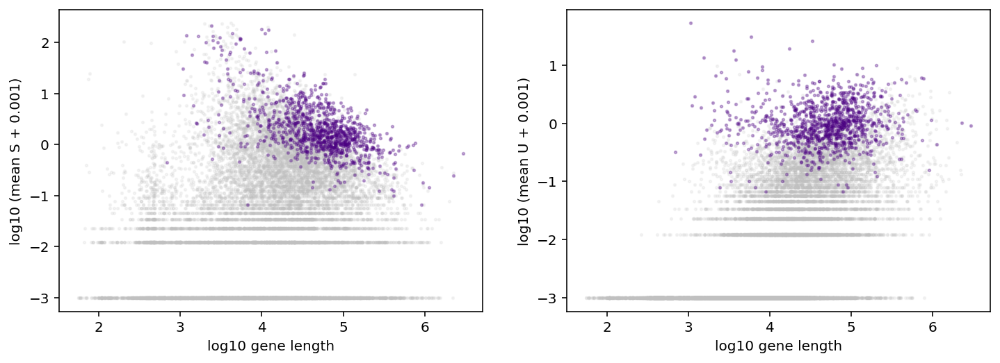

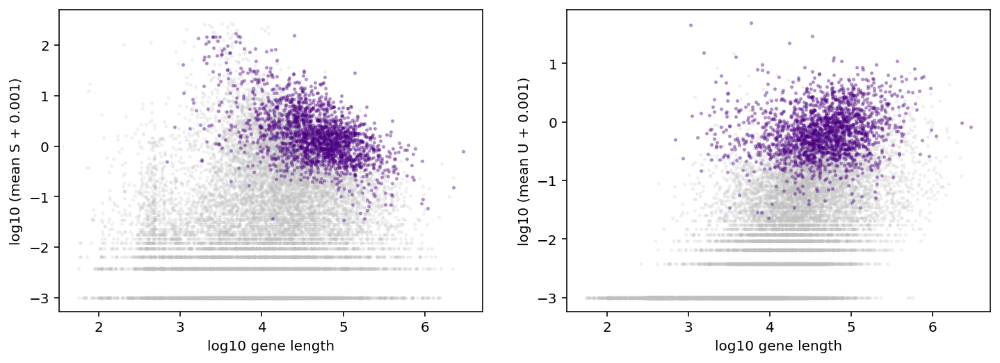

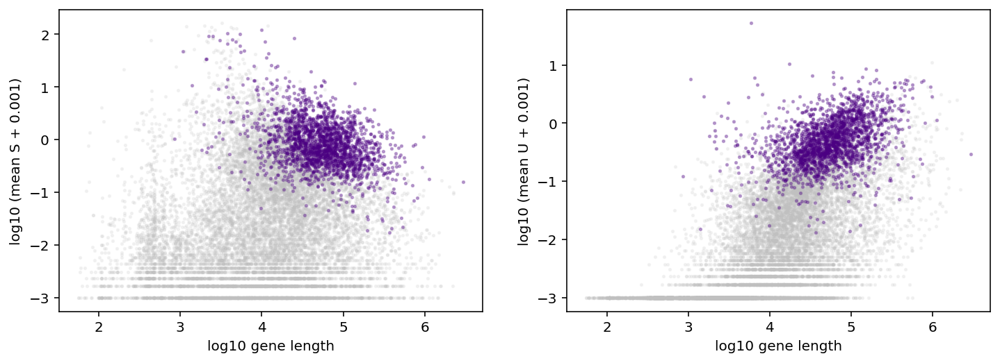

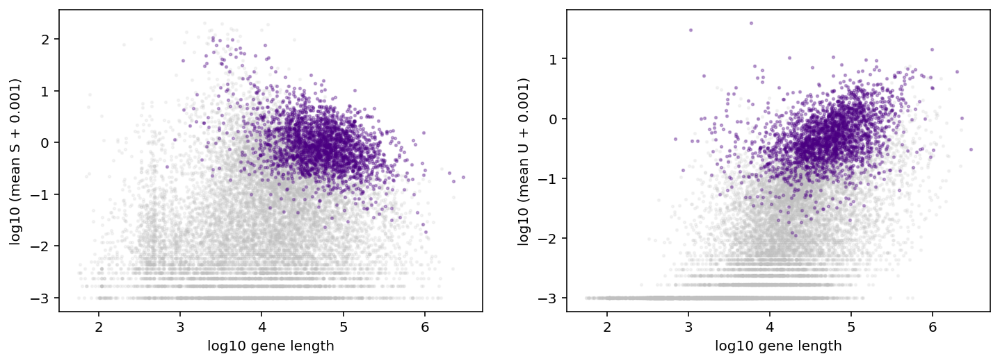

In [30]:
#Set the marker genes to be fit if possible
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='germ_all',batch_id=1,\
                                             n_genes=3000,exp_filter_threshold=None,cf=cf,genes_to_fit=markers)

In [15]:
dir_string = './fits/gg_230316_026_germ_all_1' #'./fits/gg_230303_025_germ_all_1'
dataset_strings = [dir_string+'/'+i for i in dataset_names]


In [16]:
print(dataset_strings)
print(len(dataset_strings))

['./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16', './fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16', './fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16', './fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16', './fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12', './fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12', './fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13', './fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13', './fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11', './fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPM_E11', './fits/gg_230316_026_germ_all_1/germ_allconds_170816_O_E12', './fits/gg_230316_026_germ_all_1/germ_allconds_170816_T_E12', './fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPF_E11', './fits/gg_230316_026_germ_all_1/germ_allconds_170823_AGPM_E11', './fits/gg_230316_026_germ_all_1/germ_allconds_180222_O_E13', './fits/gg_230316_026_germ_all_1/germ_allconds_180410_O_E

## **Run *Monod* Parameter Inference**

In [17]:
#Define bounds
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [10,11] #20,21 #run across grid of technical/sampling parameters

In [18]:
print(len(dataset_strings))

16


In [224]:
#How many 'marker' genes selected
test = pd.read_csv('/home/tchari/perturbCME/notebooks/fits/gg_230316_026_germ_all_1/genes.csv',header=None)
test.head()

,0,1,2,3,4,5,6,7,8,9,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
0,Mybl1,Vcpip1,Cops5,Arfgef1,Prdm14,Ncoa2,Tram1,Lactb2,Stau2,Eloc,...,Ptpre,Mgmt,Glrx3,Ppp2r2d,Inpp5a,Psmd13,Ptdss2,Phrf1,Rplp2,Ap2a2


In [225]:
selected = [i for i in markers if i in list(test.loc[0])]
len(selected)

35

In [ ]:
result_strings = []
for i in range(n_datasets): #Re-run datasets that were never fit, [7:]
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':20,'init_pattern':'moments','num_restarts':5})
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, dataset_attr_names=attribute_names,cf=cf[i])
    full_result_string = inference_parameters.fit_all_grid_points(30,search_data)

    result_strings.append(full_result_string)

INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170313_O_E16
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [2:45:34<00:00, 90.32s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 9939.5 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170313_T_E16
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/raw.sd.
INFO:root:Starting parallelized gri

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [2:49:46<00:00, 92.60s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 10192.7 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170712_O_E16
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/raw.sd.
INFO:root:Starting parallelized gr

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [2:33:20<00:00, 83.64s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 9205.8 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170712_T_E16
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/raw.sd.
INFO:root:Starting parallelized gri

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [2:38:21<00:00, 86.38s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 9507.8 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170724_O_E12
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/raw.sd.
INFO:root:Starting parallelized gri

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [2:51:32<00:00, 93.57s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 10298.4 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170724_T_E12
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/raw.sd.
INFO:root:Starting parallelized gr

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [2:33:51<00:00, 83.92s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 9237.2 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170726_T_E13
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/raw.sd.
INFO:root:Starting parallelized gri

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [3:03:38<00:00, 100.17s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/analysis_figures created.
INFO:root:Runtime: 11024.3 seconds.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11 created.
INFO:root:Global inference parameters stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: germ_allconds_170802_T_E13
INFO:root:21103 features observed, 17922 match genome annotations. 14874 were unique.
INFO:root:Gene list extracted from ./fits/gg_230316_026_germ_all_1/genes.csv.
INFO:root:Directory ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/diagnostic_figures already exists.
INFO:root:Search data stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:Starting parallelized gr

 51%|███████████████████████████████████████████████████████████                                                         | 56/110 [2:10:55<1:01:34, 68.42s/it]

In [19]:
result_strings = [i+'/Bursty_Poisson_10x11/grid_scan_results.res' for i in dataset_strings] #20x21
print(result_strings[0])

./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/grid_scan_results.res


In [20]:
len(result_strings)

16

## **QC and Analysis of Results**

In [74]:
n_datasets

16

In [ ]:
#Run tests for gene rejection and uncertainty calcs (std error of params)
for i in range(n_datasets):
    sr = monod.analysis.load_search_results(result_strings[i])
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.find_sampling_optimum()
    sr.plot_landscape(ax1)

    fig1,ax1 = plt.subplots(1,1)
    sr.plot_KL(ax1)

    #sr.plot_gene_distributions(sd,marg='joint') #Rerun fits, and try uncommenting

    _=sr.chisquare_testing(sd,threshold=1e-3)
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

    sr.compute_sigma(sd,num_cores=60)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
    sr.plot_param_marg()
    
    monod.analysis.make_batch_analysis_dir([sr],dir_string)
    sr.update_on_disk()
    

In [21]:
#Read back in results
sr_arr = [monod.analysis.load_search_results(r[:-4]+'_upd.res') for r in result_strings]

INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x1

In [22]:
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+dataset_names[i])
    print(str(i)+': '+str(sr.samp_optimum))
    print()

0: germ_allconds_170313_O_E16
0: (-6.777777777777778, -1.7999999999999998)

1: germ_allconds_170313_T_E16
1: (-5.666666666666666, -0.6999999999999997)

2: germ_allconds_170712_O_E16
2: (-5.666666666666666, -0.6999999999999997)

3: germ_allconds_170712_T_E16
3: (-6.777777777777778, -0.6999999999999997)

4: germ_allconds_170724_O_E12
4: (-6.222222222222222, -1.25)

5: germ_allconds_170724_T_E12
5: (-6.777777777777778, -1.7999999999999998)

6: germ_allconds_170726_T_E13
6: (-6.777777777777778, -1.25)

7: germ_allconds_170802_T_E13
7: (-6.222222222222222, -0.6999999999999997)

8: germ_allconds_170814_AGPF_E11
8: (-6.222222222222222, -0.6999999999999997)

9: germ_allconds_170814_AGPM_E11
9: (-6.777777777777778, -1.25)

10: germ_allconds_170816_O_E12
10: (-7.333333333333333, -1.7999999999999998)

11: germ_allconds_170816_T_E12
11: (-6.777777777777778, -1.25)

12: germ_allconds_170823_AGPF_E11
12: (-6.777777777777778, -0.6999999999999997)

13: germ_allconds_170823_AGPM_E11
13: (-6.22222222222

(-6.777777777777778, -1.7999999999999998)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-5.666666666666666, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-5.666666666666666, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-6.777777777777778, -0.6999999999999997)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-6.222222222222222, -1.25)
INFO:root:Figure stored to ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/analysis_figures/length_dependence.png.
(-6.777777777777778, -1.7999999999999998)
INFO:root:Figure stored to 

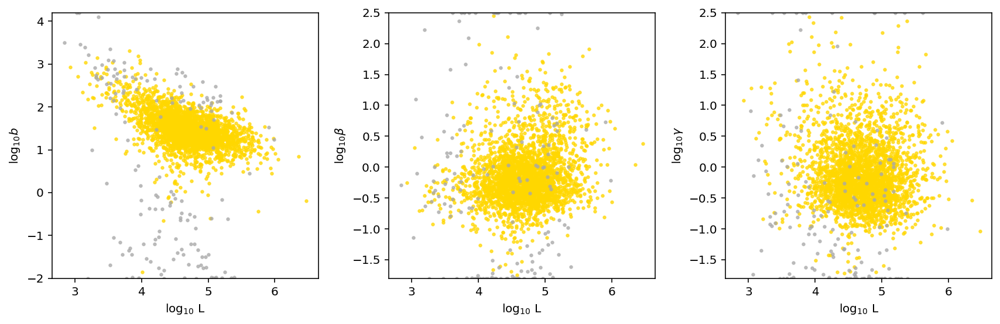

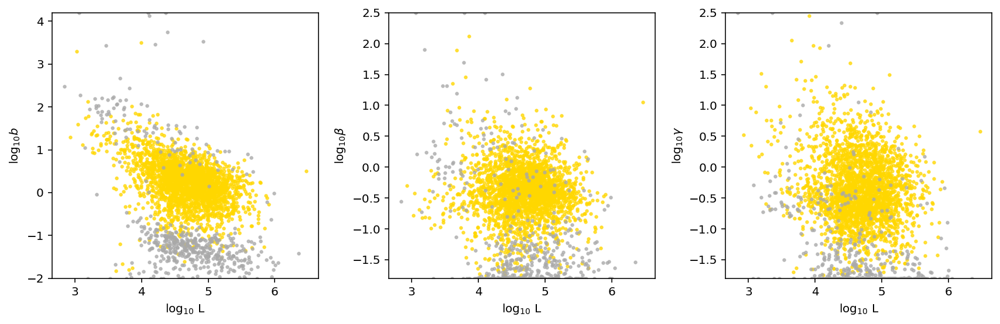

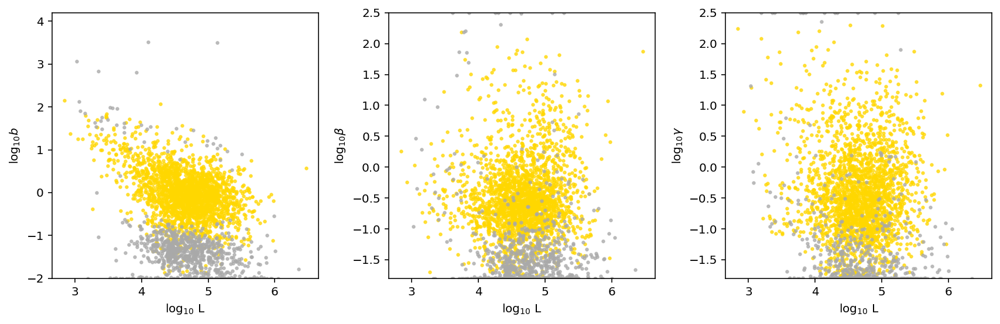

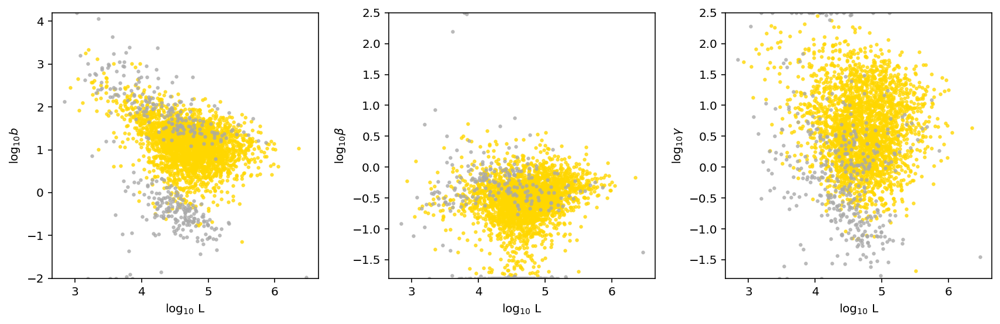

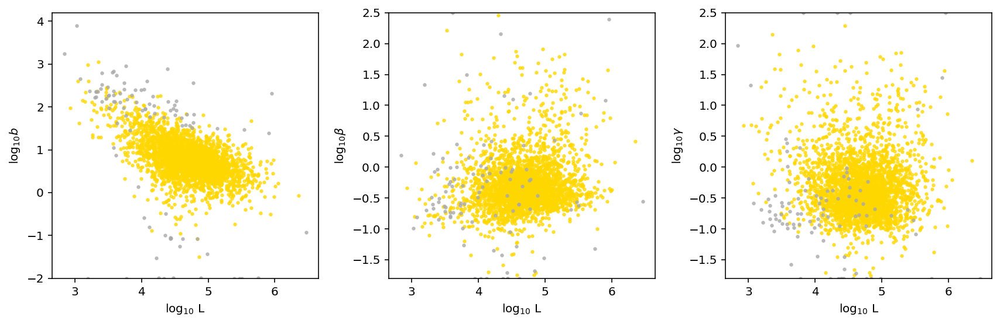

...

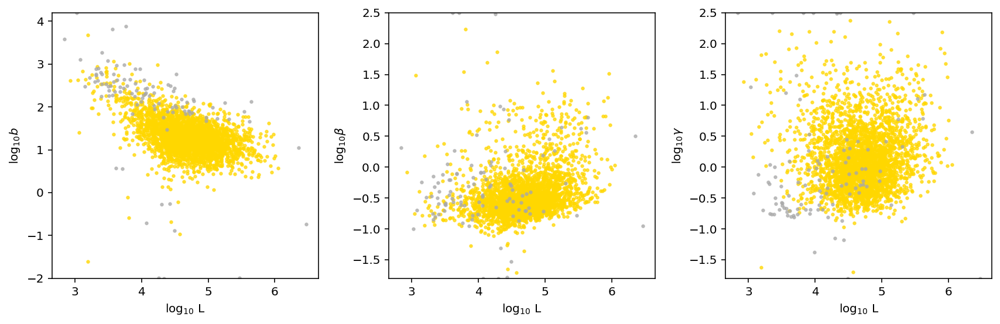

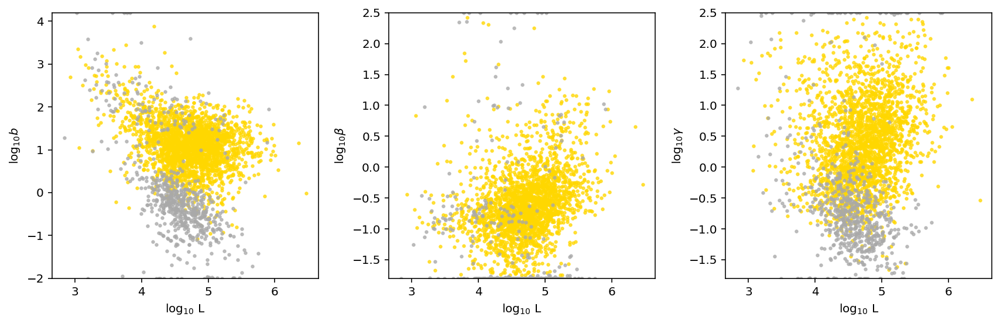

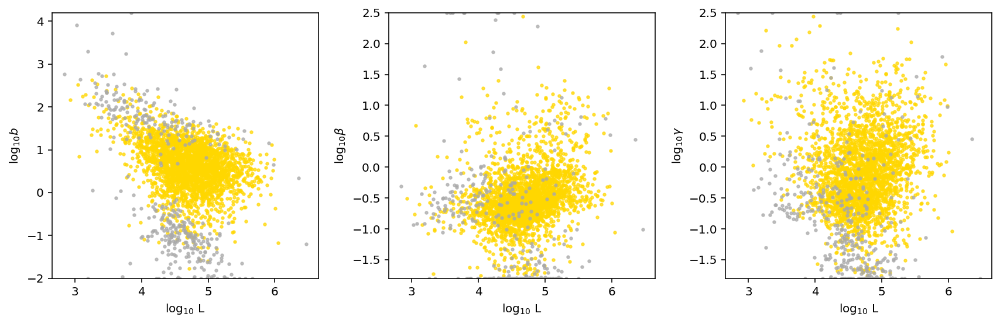

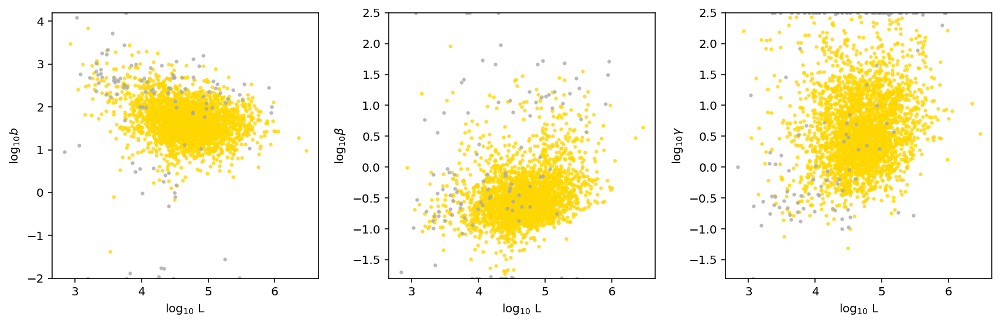

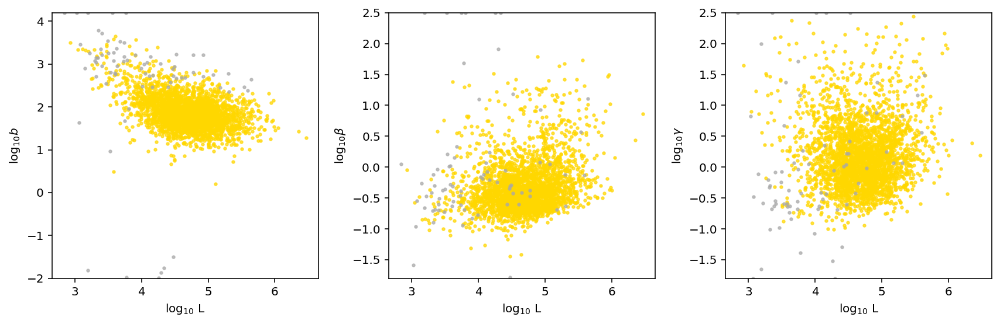

In [233]:
#See parameter fits per dataset
opt=[]
n_cells = []
for sr in sr_arr:
    y = sr.samp_optimum
    print(y)
    opt.append(y)
    n_cells.append(sr.n_cells)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
opt = np.asarray(opt)
n_cells = np.asarray(n_cells)

In [ ]:
for i in range(len(dataset_names)):
    sr = sr_arr[i]
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    fig1,ax1 = plt.subplots(1,1)
    sr.plot_landscape(ax1)
    
    sr.resample_opt_viz()
    sr.resample_opt_mc_viz()
    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

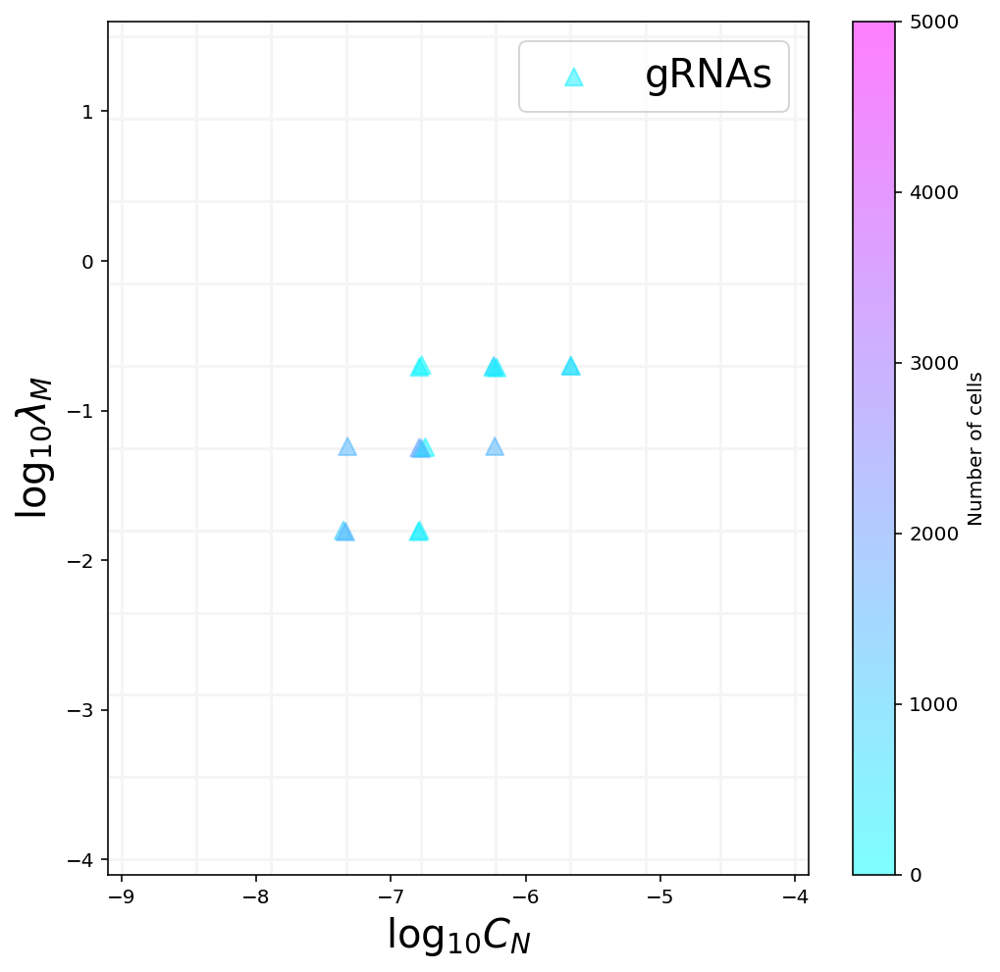

In [235]:
#plot technical parameters for each stage (they were sequenced separately)
xl = np.asarray([sr.sp.samp_lb[0],sr.sp.samp_ub[0]])
yl = np.asarray([sr.sp.samp_lb[1],sr.sp.samp_ub[1]])
x=np.linspace(xl[0],xl[1],sr.sp.gridsize[0])
y=np.linspace(yl[0],yl[1],sr.sp.gridsize[1])

fs = 20
d=0.1

fig1,ax1 = plt.subplots(1,1,figsize=(8,8))
for i in range(sr.sp.gridsize[0]):
    plt.plot([x[i]]*2,yl + [-d,d],c='whitesmoke')
for i in range(sr.sp.gridsize[1]):
    plt.plot(xl+ [-d,d],[y[i]]*2,c='whitesmoke')
jit = np.random.randn(n_datasets,2)*0.01
opt_ = opt+jit
cmap = 'cool'

# ctf = range(6,n_datasets)
# plt.scatter(opt_[ctf,0],opt_[ctf,1],100,n_cells[ctf],zorder=1000,
#             alpha=0.3,cmap=cmap,label='Cell types',vmin=0,vmax=5000)

stf = range(n_datasets) #-1 to exclude combo control

plt.scatter(opt_[stf,0],opt_[stf,1],80,n_cells[stf],marker='^',zorder=1000,
            alpha=0.5,cmap=cmap,label='gRNAs',vmin=0,vmax=5000)
plt.xlim(xl+ [-d,d])
plt.ylim(yl+ [-d,d])

plt.legend(fontsize=fs,loc='upper right')
plt.colorbar(label='Number of cells')

plt.xlabel(r'$\log_{10} C_N$',fontsize=fs)
plt.ylabel(r'$\log_{10} \lambda_M$',fontsize=fs)

fig_string = sr.batch_analysis_string+'/landscape_qc.png'
plt.savefig(fig_string,dpi=450)

In [23]:
#Read in raw counts for each stae/condition
sd_arr = []
for i in range(len(dataset_names)): 
    sd_arr += [monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')]

INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/raw.sd.
INFO:root:Search data loaded from ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_A

## **Analyze Kinetic Trends over Stages**

In [24]:
# a e s t h e t i c s
from matplotlib.colors import ListedColormap

#all
col_gold = [203/255,197/255,149/255]
col_gray = [116/255,112/255,113/255]
col_red = [212/255,107/255,75/255]
col_b = ['#1B9AAA']
col_beta = ['#9fcbee']
col_gamma =['#3C50B1']
col_expr = ['#9299A0']

### SI figures
ms = 0.7
lw = ms
ms_fail = 1
alf = 0.3
alf_fail = 0.5
sifig_aesth = (ms,lw,ms_fail,alf,alf_fail)

### Body figures
ms = 2
lw = ms
ms_fail = 2
alf = 0.3
alf_fail = 0.8
msfig_aesth = (ms,lw,ms_fail,alf,alf_fail)

markerstyle = None

c_highlight = col_red
c1 = [173/255,214/255,200/255]
c2 = [59/255,131/255,130/255]
ncol=20
cmap = ListedColormap(np.array([np.linspace(c2[j],c1[j],ncol) for j in range(3)]).T)

In [25]:
palette={'b':col_b[0],'beta':col_beta[0],'gamma':col_gamma[0],'expr':col_expr[0]}

In [26]:
for i in range(len(result_strings)):
    print(str(i)+': '+result_strings[i])

0: ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_O_E16/Bursty_Poisson_10x11/grid_scan_results.res
1: ./fits/gg_230316_026_germ_all_1/germ_allconds_170313_T_E16/Bursty_Poisson_10x11/grid_scan_results.res
2: ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_O_E16/Bursty_Poisson_10x11/grid_scan_results.res
3: ./fits/gg_230316_026_germ_all_1/germ_allconds_170712_T_E16/Bursty_Poisson_10x11/grid_scan_results.res
4: ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_O_E12/Bursty_Poisson_10x11/grid_scan_results.res
5: ./fits/gg_230316_026_germ_all_1/germ_allconds_170724_T_E12/Bursty_Poisson_10x11/grid_scan_results.res
6: ./fits/gg_230316_026_germ_all_1/germ_allconds_170726_T_E13/Bursty_Poisson_10x11/grid_scan_results.res
7: ./fits/gg_230316_026_germ_all_1/germ_allconds_170802_T_E13/Bursty_Poisson_10x11/grid_scan_results.res
8: ./fits/gg_230316_026_germ_all_1/germ_allconds_170814_AGPF_E11/Bursty_Poisson_10x11/grid_scan_results.res
9: ./fits/gg_230316_026_germ_all_1/germ_allconds_170

**Genes with splicing regulation during spermatogenesis**

In [27]:
#Set control as earliest stage sample

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))

control = 12

for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum #control params
    par_vals_uncorrected[1,j,:,:] = sr_arr[j].phys_optimum

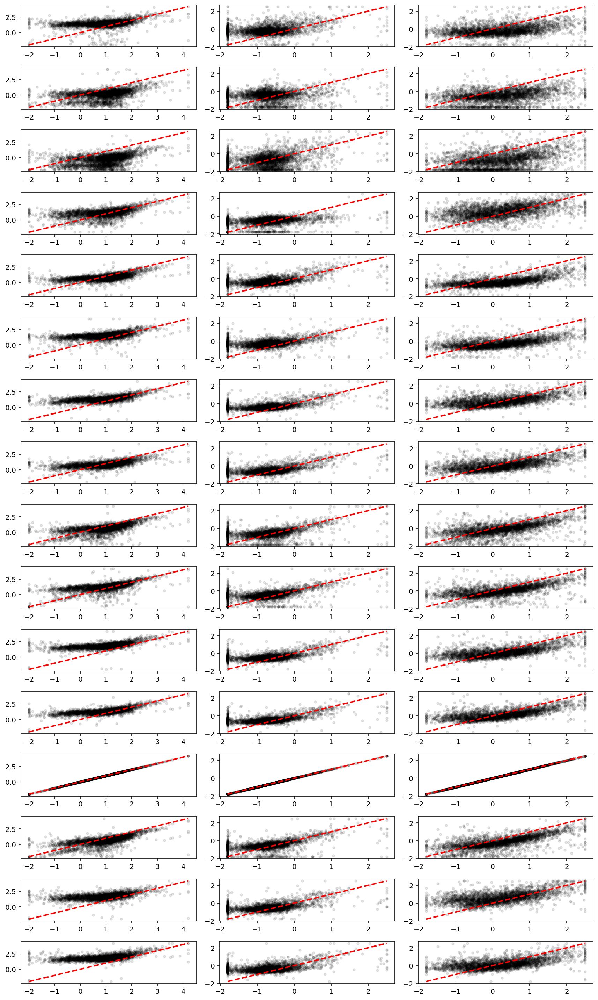

In [42]:
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(12,20))
for d in range(n_datasets):
    for k in range(n_phys_pars):
        x=par_vals_uncorrected[0,d,:,k]
        y=par_vals_uncorrected[1,d,:,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

In [28]:
#Correct offset between params, compared to control

param_names = sr_arr[0].model.get_log_name_str()
offsets = []
par_vals = np.copy(par_vals_uncorrected)
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[0,0,:,k]
    for j in range(n_datasets):
        m2 = par_vals_uncorrected[1,j,:,k]
        offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
        par_vals[1,j,:,k] -= offset

/home/tchari/miniconda3/envs/py39/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/tchari/monod/src/monod/analysis.py:724: RuntimeWarning: invalid value encountered in divide
  z = (resid - fitparams[0]) / fitparams[1]


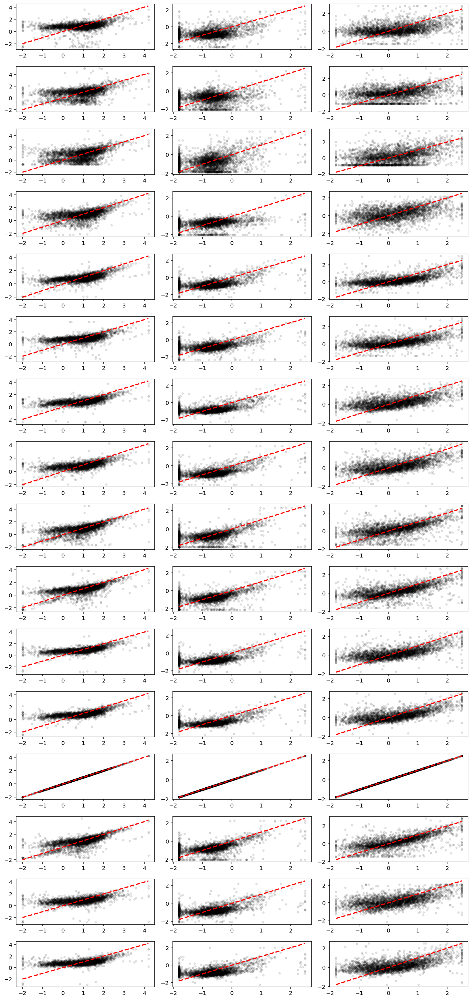

In [323]:
#Inspect
fig1,ax1 = plt.subplots(n_datasets,n_phys_pars,figsize=(12,25))
for d in range(n_datasets):
    for k in range(n_phys_pars):
        x=par_vals[0,d,:,k]
        y=par_vals[1,d,:,k]
        xl = [min(x),max(x)]
        ax1[d,k].scatter(x,y,10,'k',alpha=0.1) 

        ax1[d,k].plot(xl,xl,'r--',linewidth=2)
fig1.tight_layout()

Set genes to look at, from the literature, and corresponding stages to compare

In [29]:
gs = sr_arr[0].gene_names
ms = [m for m in markers if m in gs]

splice_genes = np.unique(['Bnc2','Dmrt1', 'Ccnd3','Tbrg4', 'Supt6','Rbm38'] +ms) #'Tet1','Rbm38'
stages = ['E11']*2+['E12']*2+['E13']*2+['E16']*2

t_inds = [9,13,5,11,6,7,1,3] #12,13
o_inds = [8,12,4,10,14,15,0,2]

In [30]:
#Get param values + error in params for each stage/sex across genes

params_save = []
vals_save = []
stage_save = []
sex_save = []
gene_save = []
errs_save = []

for g in gs: #splice_genes:
    
    for stg in range(len(stages)):
        
        f = gs==g
        t_params = par_vals[1,t_inds[stg],f,:][0]
        o_params = par_vals[1,o_inds[stg],f,:][0]
        
        #Add sigma here
        t_err = 2.756*sr_arr[t_inds[stg]].sigma[f,:].flatten() #95% C.I.
        o_err = 2.756*sr_arr[o_inds[stg]].sigma[f,:].flatten()
        
        vals_save += list(t_params)
        vals_save += list(o_params)
        
        params_save += ['b','beta','gamma']*2
#         if stages[stg] == 'E11':
#             sex_save += ['n/a']*3+['n/a']*3
#         else:
        sex_save += ['testes']*3+['ovary']*3
        stage_save += [stages[stg]]*6
        
        gene_save += [g]*6
        
        errs_save += list(t_err)+list(o_err)
        
param_out = pd.DataFrame()
param_out['Param'] = params_save
param_out['Value'] = vals_save
param_out['Stage'] = stage_save
param_out['Sex'] = sex_save
param_out['Gene'] = gene_save
param_out['Err'] = errs_save
    
param_out.head()
        


,Param,Value,Stage,Sex,Gene,Err
0,b,-0.879339,E11,testes,Mybl1,5.670752
1,beta,-1.918793,E11,testes,Mybl1,5.666023
2,gamma,-0.883363,E11,testes,Mybl1,5.671416
3,b,0.228581,E11,ovary,Mybl1,3.604186
4,beta,-1.071631,E11,ovary,Mybl1,3.598692


**Plot trends of parameters over stages**

In [31]:
def plot_splicing(param_out,gene_name,hue='Param',pal=palette,fname=None):
    fig, ax1 = plt.subplots(1, 1,figsize=(5,3))

    sub = param_out[param_out.Gene.isin([gene_name]) & param_out.Param.isin(['beta'])]
    g=sns.scatterplot(data=sub,x='Stage',y='Value',hue=hue,
                    palette=pal,edgecolor='black',style='Sex',s=50,ax=ax1)


    plt.errorbar([0]*4 + [1]*4 + [2]*4 +[3]*4,sub['Value'].values,yerr=sub['Err'].values,
                 c='lightgrey',alpha=alf,
                    linestyle='None',linewidth=lw/1.5,zorder=-100)

    plt.xticks([0]*4 + [1]*4 + [2]*4 +[3]*4, sub['Stage'])

    sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

    plt.tight_layout()
    if fname is not None:
        plt.savefig(fname)
    

In [32]:
param_out['Stage_Sex'] = param_out.apply(lambda x:'%s_%s' % (x['Stage'],x['Sex']),axis=1)

#[list(param_out['Stage'])[i] + '_' + list(param_out['Sex'])[i] for i in range(len(param_out['Stage']))]

In [33]:
#Match colors to study
stage_palette = {'E11_ovary':'lightgray','E11_testes':'lightgray',
                'E12_ovary':'#7F5754','E12_testes':'#AEE49C',
                'E13_ovary':'#E970C7','E13_testes':'#F99CA5',
                'E16_ovary':'#A9B84A','E16_testes':'#C4AAD7'}

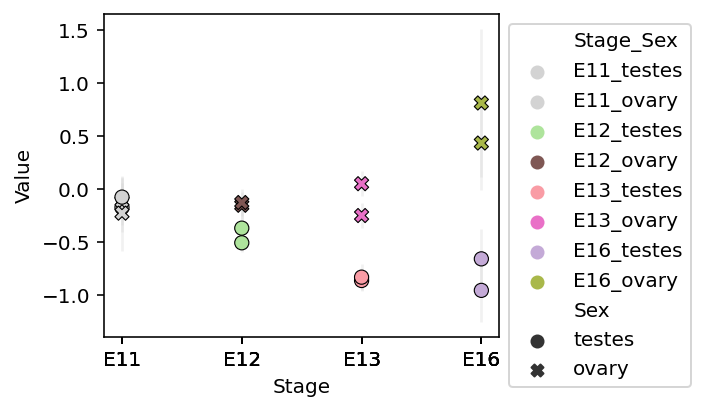

In [97]:
plot_splicing(param_out,'Ccnd3',hue='Stage_Sex',pal=stage_palette,fname='ccnd3.pdf')

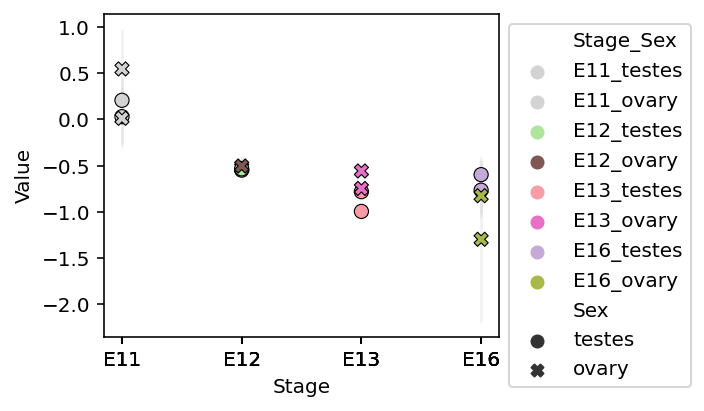

In [98]:
plot_splicing(param_out,'Bnc2',hue='Stage_Sex',pal=stage_palette,fname='bnc2.pdf')

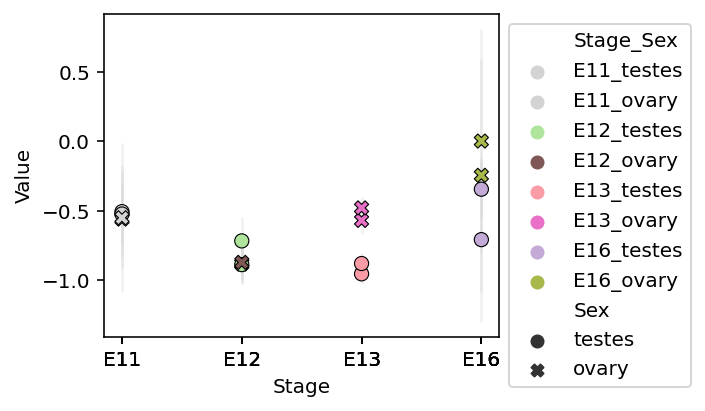

In [99]:
plot_splicing(param_out,'Dmrt1',hue='Stage_Sex',pal=stage_palette,fname='dmrt1.pdf')

**Plot genes with likely changes in k,i.e., where beta and gamma change together**

When FCs of beta/k ('beta') and gamma/k ('gamma') change together, likely that k (transription rate/burst freq) is changing

In [34]:
#Make dataframe with param FCs

#Get param FCs for each stage/sex across genes

params_save = []
vals_save = []
stage_save = []
sex_save = []
gene_save = []




for g in gs:
    
    for stg in range(2,len(stages)):
        
        f = gs==g
        t_params = par_vals[1,t_inds[stg],f,:][0]
        o_params = par_vals[1,o_inds[stg],f,:][0]
        
        #Add sigma here
        t_FC = np.log2(10**(par_vals[1,t_inds[stg],f,:][0] - par_vals[1,t_inds[0],f,:][0])) #vs E11
        o_FC = np.log2(10**(par_vals[1,o_inds[stg],f,:][0] - par_vals[1,o_inds[0],f,:][0]))
        
        
        t_mu = (par_vals[1,t_inds[stg],f,0]-par_vals[1,t_inds[stg],f,2]) - (par_vals[1,t_inds[0],f,0]-par_vals[1,t_inds[0],f,2])
        o_mu = (par_vals[1,o_inds[stg],f,0]-par_vals[1,o_inds[stg],f,2]) - (par_vals[1,o_inds[0],f,0]-par_vals[1,o_inds[0],f,2])
        
        vals_save += list(t_FC)+list(np.log2(1/10**(par_vals[1,t_inds[stg],f,2] - par_vals[1,t_inds[0],f,2]))) + list(t_mu) #betas-->k
        vals_save += list(o_FC)+list(np.log2(1/10**(par_vals[1,o_inds[stg],f,2] - par_vals[1,o_inds[0],f,2]))) + list(o_mu)
        
        params_save += ['b','beta','gamma','k','mu_s']*2

        sex_save += ['testes']*5+['ovary']*5
        
        stage_save += [stages[stg]]*10
        
        gene_save += [g]*10
        

        
fc_out = pd.DataFrame()
fc_out['Param'] = params_save
fc_out['FC'] = vals_save
fc_out['Stage'] = stage_save
fc_out['Sex'] = sex_save
fc_out['Gene'] = gene_save

    
fc_out.head()
        


,Param,FC,Stage,Sex,Gene
0,b,6.204560,E12,testes,Mybl1
1,beta,4.085115,E12,testes,Mybl1
2,gamma,5.439835,E12,testes,Mybl1
3,k,-5.439835,E12,testes,Mybl1
4,mu_s,0.230205,E12,testes,Mybl1


Plot spline of param changes over stages (parallels the analyses done in the original study)

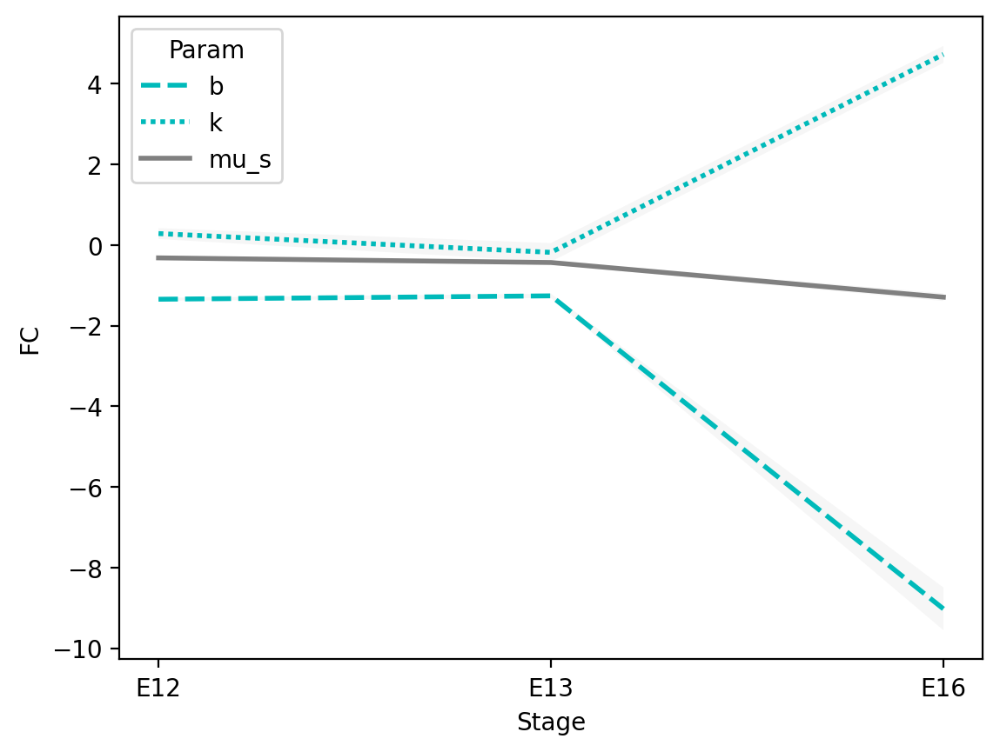

In [51]:
#Style palette
s_dict = {'b':'dashed','k':'dotted','mu_s':'solid'}

sub = fc_out[fc_out.Gene.isin(['Nanog'])]
sub = sub[sub['Param'].isin(['b','k','mu_s'])] #invert betaFC + get inferred mean (U) (b+beta - b+beta_ctrl)
sub = sub[sub['Sex'].isin(['testes'])]


sns.lineplot(data=sub, x="Stage", y="FC",style="Param",hue='Param',palette={'b':'#00BABA','k':'#00BABA','mu_s':'gray'},
            err_kws={'fc': 'lightgray','edgecolor':'none'},linewidth=2,style_order=['mu_s','b','k'])

plt.savefig('nanog_lines_testes.pdf')

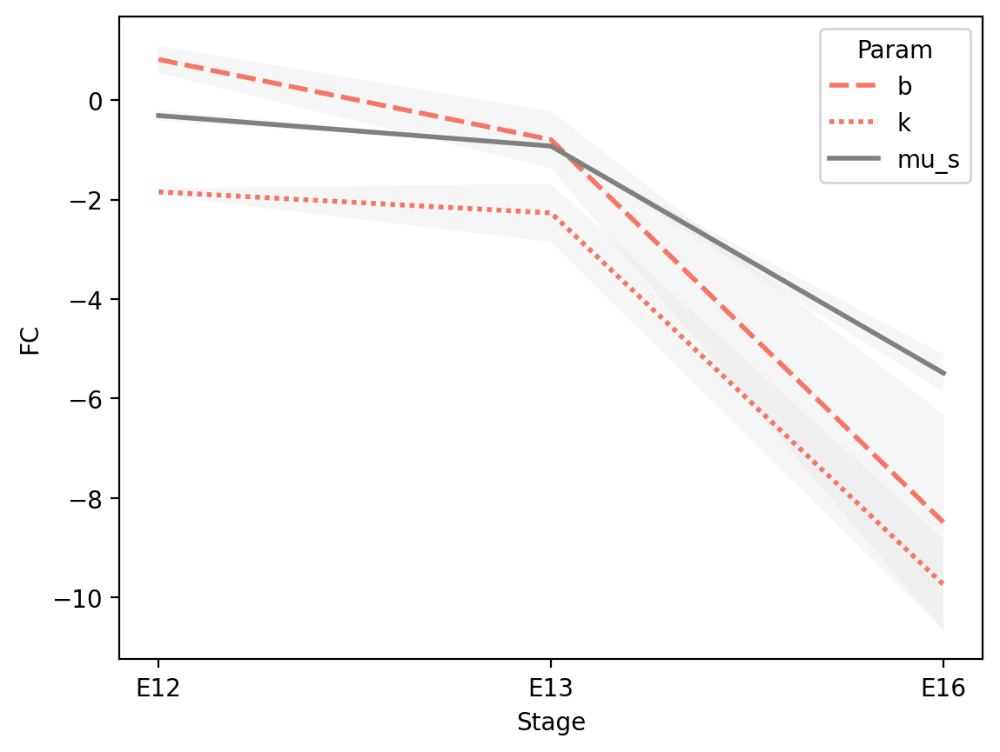

In [54]:
#Style palette

sub = fc_out[fc_out.Gene.isin(['Nanog'])]
sub = sub[sub['Param'].isin(['b','k','mu_s'])] #invert betaFC + get inferred mean (U) (b+beta - b+beta_ctrl)
sub = sub[sub['Sex'].isin(['ovary'])]

sns.lineplot(data=sub, x="Stage", y="FC",style="Param",hue='Param',palette={'b':'#F57664','k':'#F57664','mu_s':'gray'},
            err_kws={'fc': 'lightgray','edgecolor':'none'},linewidth=2,style_order=['mu_s','b','k'])

plt.savefig('nanog_lines_ovary.pdf')

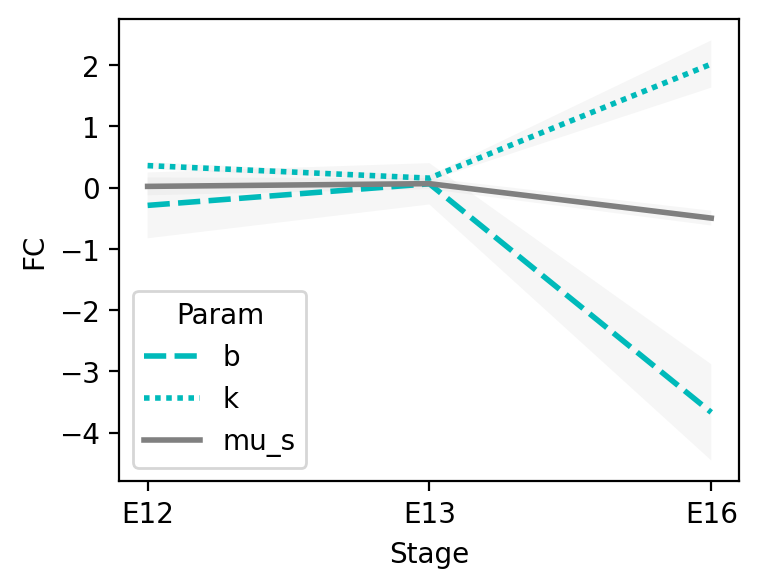

In [60]:
#Style palette
plt.figure(figsize=(4,3))

sub = fc_out[fc_out.Gene.isin(['Tbrg4'])]
sub = sub[sub['Param'].isin(['b','k','mu_s'])] #invert betaFC + get inferred mean (U) (b+beta - b+beta_ctrl)
sub = sub[sub['Sex'].isin(['testes'])]

sns.lineplot(data=sub, x="Stage", y="FC",style="Param",color='#00BABA',
             hue='Param',palette={'b':'#00BABA','k':'#00BABA','mu_s':'gray'},style_order=['mu_s','b','k'],
            err_kws={'fc': 'lightgray','edgecolor':'none'},linewidth=2)
plt.savefig('tbrg4_lines_testes.pdf')

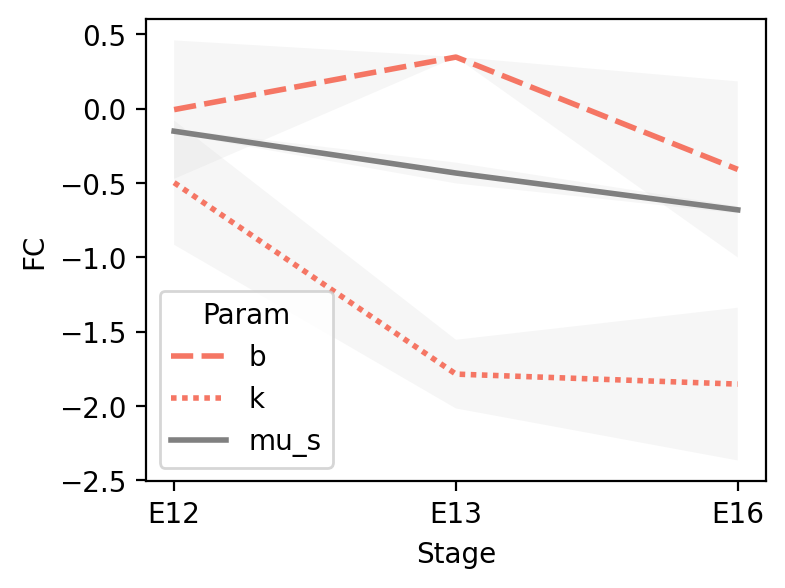

In [61]:
#Style palette
plt.figure(figsize=(4,3))
sub = fc_out[fc_out.Gene.isin(['Tbrg4'])]
sub = sub[sub['Param'].isin(['b','k','mu_s'])] #invert betaFC + get inferred mean (U) (b+beta - b+beta_ctrl)
sub = sub[sub['Sex'].isin(['ovary'])]

sns.lineplot(data=sub, x="Stage", y="FC",style="Param",color='#F57664',
             hue='Param',palette={'b':'#F57664','k':'#F57664','mu_s':'gray'},style_order=['mu_s','b','k'],
            err_kws={'fc': 'lightgray','edgecolor':'none'},linewidth=2)
plt.savefig('tbrg4_lines_ovary.pdf')

**Plot genes separate (non-covarying) changes in beta and gamma,e.g., likely splicing changes**


In [107]:
#Genes where beta and gamma FC have opp signs
diff_gs = []
for g in np.unique(fc_out['Gene']):
    sub_g = fc_out[fc_out.Gene.isin([g])]
    
    stgs = np.unique(sub_g.Stage)
    sexs = np.unique(sub_g.Sex)
    
    signs_beta = np.array(sub_g.FC[sub_g.Param.isin(['beta'])] > 0)
    signs_gamma = np.array(sub_g.FC[sub_g.Param.isin(['gamma'])] > 0)
    
    diffs = np.count_nonzero(signs_beta != signs_gamma) #Number of mismatches
    
    if diffs > 6: #Select genes with many diffs between beta and gamma FCs
        diff_gs += [g]
    
print(len(diff_gs))  

98


In [108]:
def plot_all_params(param_out,gene_name,hue='Param',pal=palette,sharey=True,fname=None,figsize=(15,3)):
    #Plot all params trends next to each other
    fig, ax1 = plt.subplots(1, 3,figsize=figsize,sharey=sharey)

    sub = param_out[param_out.Gene.isin([gene_name]) & param_out.Param.isin(['b'])]
    g=sns.scatterplot(data=sub,x='Stage',y='Value',hue=hue,
                    palette=pal,edgecolor='black',style='Sex',s=70,ax=ax1[0],legend=False)


    ax1[0].errorbar([0]*4 + [1]*4 + [2]*4 +[3]*4,sub['Value'].values,yerr=sub['Err'].values,
                 c='lightgrey',alpha=alf,
                    linestyle='None',linewidth=lw/1.5,zorder=-100)
    

    #ax1[0].set_xticks([0]*4 + [1]*4 + [2]*4 +[3]*4, sub['Stage'])
    
    sub = param_out[param_out.Gene.isin([gene_name]) & param_out.Param.isin(['beta'])]
    g=sns.scatterplot(data=sub,x='Stage',y='Value',hue=hue,
                    palette=pal,edgecolor='black',style='Sex',s=70,ax=ax1[1],legend=False)


    ax1[1].errorbar([0]*4 + [1]*4 + [2]*4 +[3]*4,sub['Value'].values,yerr=sub['Err'].values,
                 c='lightgrey',alpha=alf,
                    linestyle='None',linewidth=lw/1.5,zorder=-100)
    
    
    sub = param_out[param_out.Gene.isin([gene_name]) & param_out.Param.isin(['gamma'])]
    g=sns.scatterplot(data=sub,x='Stage',y='Value',hue=hue,
                    palette=pal,edgecolor='black',style='Sex',s=70,ax=ax1[2])


    ax1[2].errorbar([0]*4 + [1]*4 + [2]*4 +[3]*4,sub['Value'].values,yerr=sub['Err'].values,
                 c='lightgrey',alpha=alf,
                    linestyle='None',linewidth=lw/1.5,zorder=-100)
   

    sns.move_legend(g, "upper left", bbox_to_anchor=(1, 1))

    plt.tight_layout()
    plt.title(gene_name)
    if fname is not None:
        plt.savefig(fname)
    

In [109]:
#Select for genes with small error 
sml_diff_gs = []
for dg in diff_gs:
    num_var = np.sum(np.abs(param_out['Err'][param_out.Gene.isin([dg])]) > 1)
    if num_var < 2:
        sml_diff_gs += [dg]

In [110]:
len(sml_diff_gs)

34

In [ ]:
#Look at all possible genes that fit these criteria
for dg in sml_diff_gs:
    plot_all_params(param_out,dg,hue='Stage_Sex',pal=stage_palette,fname=None,figsize=(12,3))

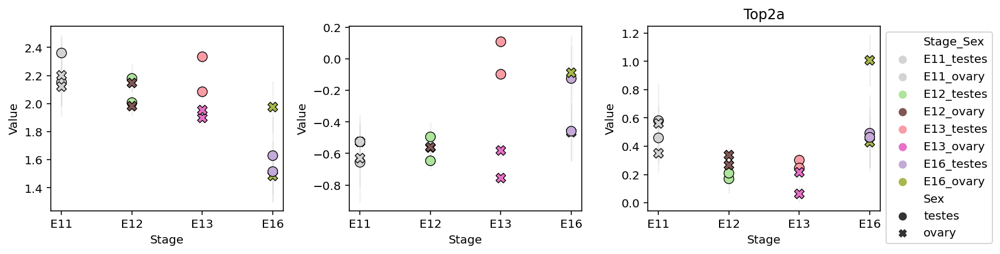

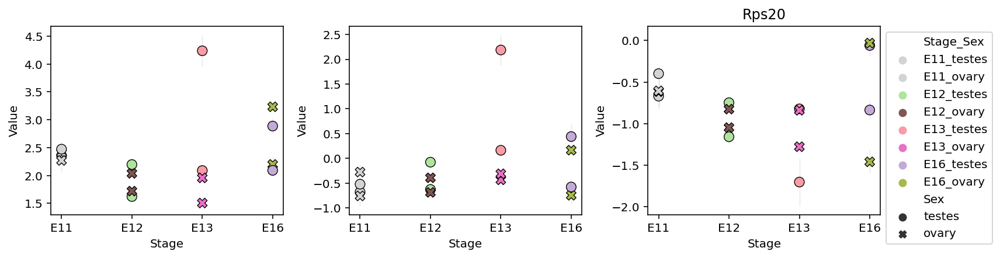

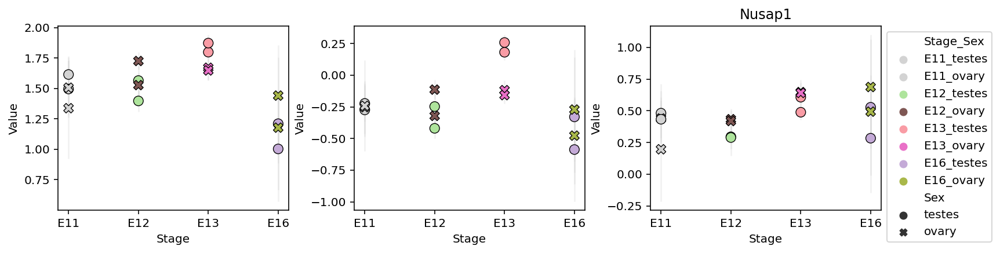

In [113]:
#Top2a, Rps20, Ccnd3
for dg in ['Top2a', 'Rps20', 'Nusap1']:
    plot_all_params(param_out,dg,hue='Stage_Sex',pal=stage_palette,sharey=False,
                    fname=dg+'_all_params.pdf',figsize=(12,3))

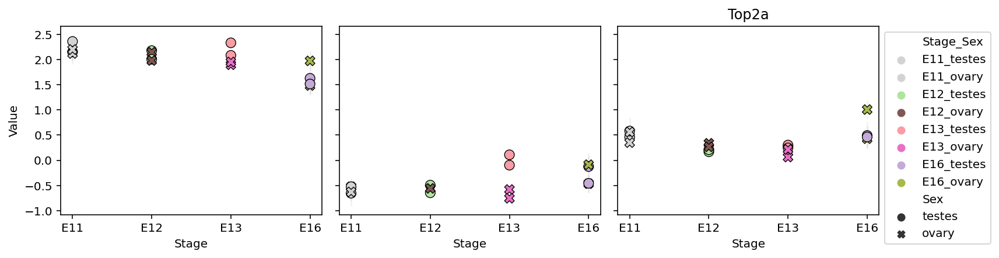

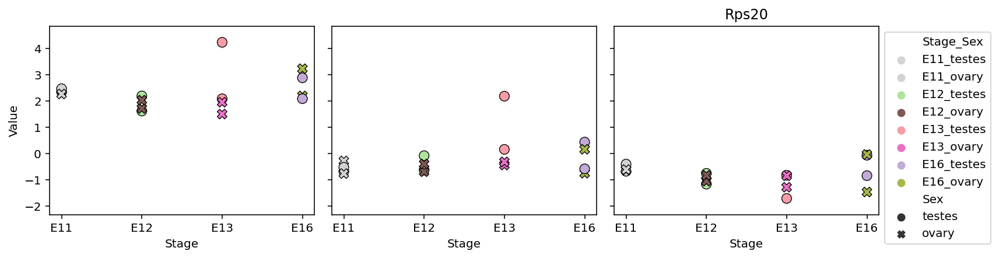

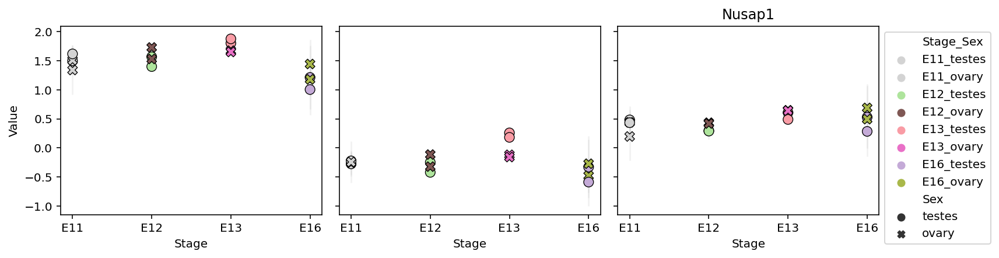

In [114]:
#Top2a, Rps20, Ccnd3
for dg in ['Top2a', 'Rps20', 'Nusap1']:
    plot_all_params(param_out,dg,hue='Stage_Sex',pal=stage_palette,sharey=True,
                    fname=dg+'_all_params_sharey.pdf',figsize=(12,3))

In [114]:
'Tbrg4' in diff_gs

False

## **Making the input loom**

In [ ]:
data_path = '/home/tchari/counts/germcell_splicing/'
meta_path = '/home/tchari/metadata/'
out_path = "/home/tchari/counts/germcell_splicing/loom/"


testS = pd.read_csv(data_path+'GSE136220_raw_counts_matrix_pgcs_no_adrenal.csv',index_col=0)
testU = pd.read_csv(data_path+'GSE136220_raw_counts_matrix_pgcs_no_adrenal_unspliced.csv',index_col=0)
ids = [s1.split(':')[0] for s1 in testS.index]

meta = pd.DataFrame()
meta['identity'] = ids
meta['cell_barcode'] = list(testS.index)
meta.to_csv(meta_path+'germCell_meta.csv',index=None) #Making metadata file

print(meta.head())

geneNames = testS.columns.values.tolist() #Check
gene_meta = pd.read_csv(meta_path+'t2g_mouse.txt',delimiter='\t',header=None)
gene_dict = dict(zip(gene_meta[1], gene_meta[2]))
geneNames = [gene_dict[i] if i in list(gene_dict.keys()) else i for i in geneNames]

S = testS.to_numpy()
U = testU.to_numpy()

fname = out_path+'allconds.loom'

print('Making Loom')
#Make loom of U/S
retAdata = anndata.AnnData(
			X=sparse.csr_matrix(S),
			layers={
				'spliced': sparse.csr_matrix(S),
				'unspliced': sparse.csr_matrix(U),
			},
			obs=pd.DataFrame({'barcode': np.array(list(testS.index))},index=np.array(list(testS.index))),
			var=pd.DataFrame({'gene_name': np.array(geneNames)},index=np.array(geneNames))
		)

retAdata.write_loom(fname)